# Semantic Pseudo-Label Generation Pipeline — Step-by-Step Visualization

This notebook visualizes every step of the CAUSE-TR + K-Means overclustering pipeline
that generates semantic pseudo-labels for unsupervised panoptic segmentation.

**Pipeline**: Input Image → Resize (322×644) → Sliding Window (3 crops) → DINOv2 ViT-B/14 (768-dim) → CAUSE Segment_TR (90-dim) → Bilinear Upsample (23×23 → 322×322) → Stitch + Average → L2 Normalize → K-Means k=80 → NN Upsample (1024×2048) → Majority Vote (80→19 classes)

```bash
┌─────────────────────────────────────────────────────────────────┐
│                SEMANTIC PSEUDO-LABEL GENERATION                 │
└─────────────────────────────────────────────────────────────────┘

┌──────────────────┐
│ Cityscapes Image  │
│ H=1024, W=2048    │
└────────┬─────────┘
         │ bilinear resize
         │ scale = 322 / min(H,W)
         │ dims rounded to ÷14
         ▼
┌──────────────────┐
│ Resized Image     │
│ H=322, W=644      │
└────────┬─────────┘
         │ sliding window: 322×322 crops, stride=161
         │
         ├──────────────────┬──────────────────┐
         ▼                  ▼                  ▼
    crop @ x=0         crop @ x=161       crop @ x=322
    322×322             322×322             322×322
         │                  │                  │
         ▼                  ▼                  ▼
  ┌──────────────┐  ┌──────────────┐  ┌──────────────┐
  │ DINOv2       │  │ DINOv2       │  │ DINOv2       │
  │ ViT-B/14     │  │ ViT-B/14     │  │ ViT-B/14     │
  │ frozen       │  │ frozen       │  │ frozen       │
  │ 768-dim      │  │ 768-dim      │  │ 768-dim      │
  └──────┬───────┘  └──────┬───────┘  └──────┬───────┘
         │                  │                  │
    529 tokens         529 tokens         529 tokens
    (23×23, 768d)      (23×23, 768d)      (23×23, 768d)
         │                  │                  │
         ▼                  ▼                  ▼
  ┌──────────────┐  ┌──────────────┐  ┌──────────────┐
  │ CAUSE        │  │ CAUSE        │  │ CAUSE        │
  │ Segment_TR   │  │ Segment_TR   │  │ Segment_TR   │
  │ frozen EMA   │  │ frozen EMA   │  │ frozen EMA   │
  │ 90-dim       │  │ 90-dim       │  │ 90-dim       │
  └──────┬───────┘  └──────┬───────┘  └──────┬───────┘
         │                  │                  │
    (90, 23, 23)       (90, 23, 23)       (90, 23, 23)
         │                  │                  │
         │ bilinear         │ bilinear         │ bilinear
         │ 23×23→322×322    │ 23×23→322×322    │ 23×23→322×322
         │                  │                  │
    (90, 322, 322)     (90, 322, 322)     (90, 322, 322)
         │                  │                  │
         └──────────────────┴──────────────────┘
                            │
                   stitch + average overlaps
                            ▼
                  ┌──────────────────┐
                  │ Feature Map       │
                  │ (90, 322, 644)    │
                  └────────┬─────────┘
                           │ L2 normalize per pixel
                           ▼
                  ┌──────────────────┐
                  │ K-Means (k=80)    │
                  │ cosine similarity  │
                  │ on 90-dim vectors  │
                  └────────┬─────────┘
                           │ cluster ID per pixel (0-79)
                           │ nearest-neighbor upsample
                           ▼
                  ┌──────────────────┐
                  │ Pseudo-Semantic   │
                  │ Label             │
                  │ 80-class, uint8   │
                  │ H=1024, W=2048    │
                  └────────┬─────────┘
                           │ majority vote
                           │ (train split, for eval only)
                           ▼
                  ┌──────────────────┐
                  │ 19-Class Mapped   │
                  │ (eval only)       │
                  └──────────────────┘
```

In [14]:
# Cell 1: Imports and Setup
import sys
import os
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from torchvision import transforms
from torchvision.transforms import InterpolationMode
from sklearn.cluster import MiniBatchKMeans

# Paths
PROJECT_ROOT = Path("/Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation")
CS_ROOT = Path("/Users/qbit-glitch/Desktop/datasets/cityscapes")
CAUSE_DIR = PROJECT_ROOT / "refs" / "cause"

# Add CAUSE repo to path
sys.path.insert(0, str(CAUSE_DIR))

# Device
DEVICE = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Device: {DEVICE}")

# ImageNet normalization (used by DINOv2)
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]
normalize = transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)

# 3 diverse val images from different cities
IMAGES = [
    {"city": "frankfurt", "stem": "frankfurt_000000_000294"},
    {"city": "lindau",    "stem": "lindau_000000_000019"},
    {"city": "munster",   "stem": "munster_000000_000019"},
]

# Build full paths
for img_info in IMAGES:
    img_info["img_path"] = str(CS_ROOT / "leftImg8bit" / "val" / img_info["city"] / f"{img_info['stem']}_leftImg8bit.png")
    img_info["gt_path"] = str(CS_ROOT / "gtFine" / "val" / img_info["city"] / f"{img_info['stem']}_gtFine_labelIds.png")
    img_info["pl_path"] = str(CS_ROOT / "pseudo_semantic_raw_k80" / "val" / img_info["city"] / f"{img_info['stem']}.png")

# Verify files exist
for img_info in IMAGES:
    assert os.path.exists(img_info["img_path"]), f"Missing: {img_info['img_path']}"
    print(f"OK: {img_info['stem']}")

# Cityscapes trainID mapping
CS_ID_TO_TRAIN = {
    7: 0, 8: 1, 11: 2, 12: 3, 13: 4, 17: 5, 19: 6, 20: 7,
    21: 8, 22: 9, 23: 10, 24: 11, 25: 12, 26: 13, 27: 14,
    28: 15, 31: 16, 32: 17, 33: 18,
}
CS_CLASS_NAMES = [
    "road", "sidewalk", "building", "wall", "fence",
    "pole", "traffic light", "traffic sign", "vegetation", "terrain",
    "sky", "person", "rider", "car", "truck",
    "bus", "train", "motorcycle", "bicycle",
]

# Cityscapes official colors (trainID order)
CS_COLORS = np.array([
    [128, 64, 128], [244, 35, 232], [70, 70, 70], [102, 102, 156], [190, 153, 153],
    [153, 153, 153], [250, 170, 30], [220, 220, 0], [107, 142, 35], [152, 251, 152],
    [70, 130, 180], [220, 20, 60], [255, 0, 0], [0, 0, 142], [0, 0, 70],
    [0, 60, 100], [0, 80, 100], [0, 0, 230], [119, 11, 32],
], dtype=np.uint8)

print("Setup complete.")

# Output directory for intermediate figure PNGs
SAVE_DIR = PROJECT_ROOT / "Research" / "mbps-panoptic-segmentation" / "Notebooks" / "intermediate_figures"
SAVE_DIR.mkdir(parents=True, exist_ok=True)
print(f"Figures will be saved to: {SAVE_DIR}")


Device: mps
OK: frankfurt_000000_000294
OK: lindau_000000_000019
OK: munster_000000_000019
Setup complete.
Figures will be saved to: /Users/qbit-glitch/Desktop/coding-projects/mbps_panoptic_segmentation/Research/mbps-panoptic-segmentation/Notebooks/intermediate_figures


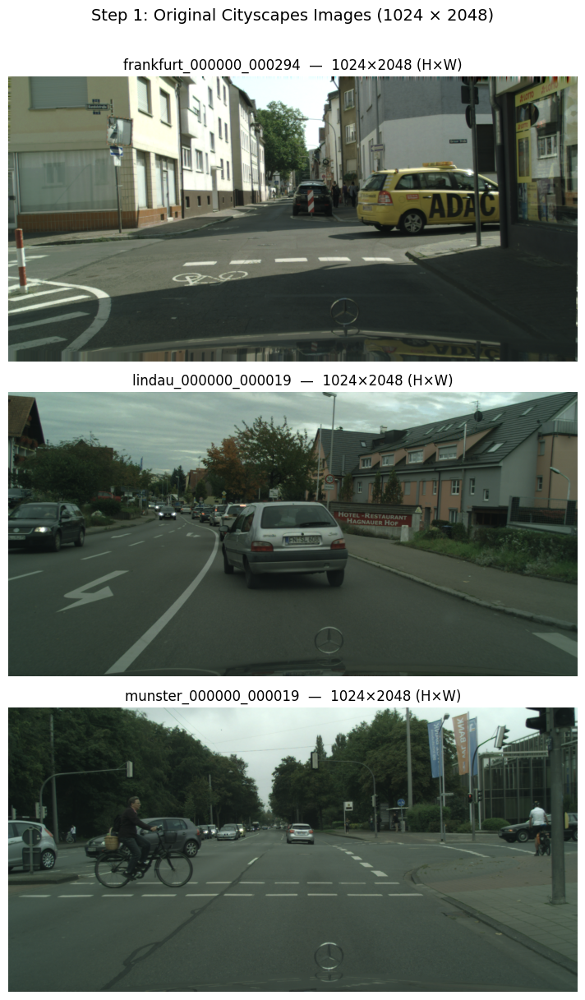

In [15]:
# Cell 2: Step 1 — Original Cityscapes Images (1024 x 2048)
fig, axes = plt.subplots(len(IMAGES), 1, figsize=(16, 4 * len(IMAGES)))
if len(IMAGES) == 1:
    axes = [axes]

for ax, img_info in zip(axes, IMAGES):
    img = np.array(Image.open(img_info["img_path"]).convert("RGB"))
    ax.imshow(img)
    ax.set_title(f"{img_info['stem']}  —  {img.shape[0]}×{img.shape[1]} (H×W)", fontsize=12)
    ax.axis("off")

fig.suptitle("Step 1: Original Cityscapes Images (1024 × 2048)", fontsize=14, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step01_original_images.png", dpi=200, bbox_inches="tight")
plt.show()

# Save individual images
for img_info in IMAGES:
    img = Image.open(img_info["img_path"]).convert("RGB")
    img.save(SAVE_DIR / f"step01_{img_info['city']}_original.png")


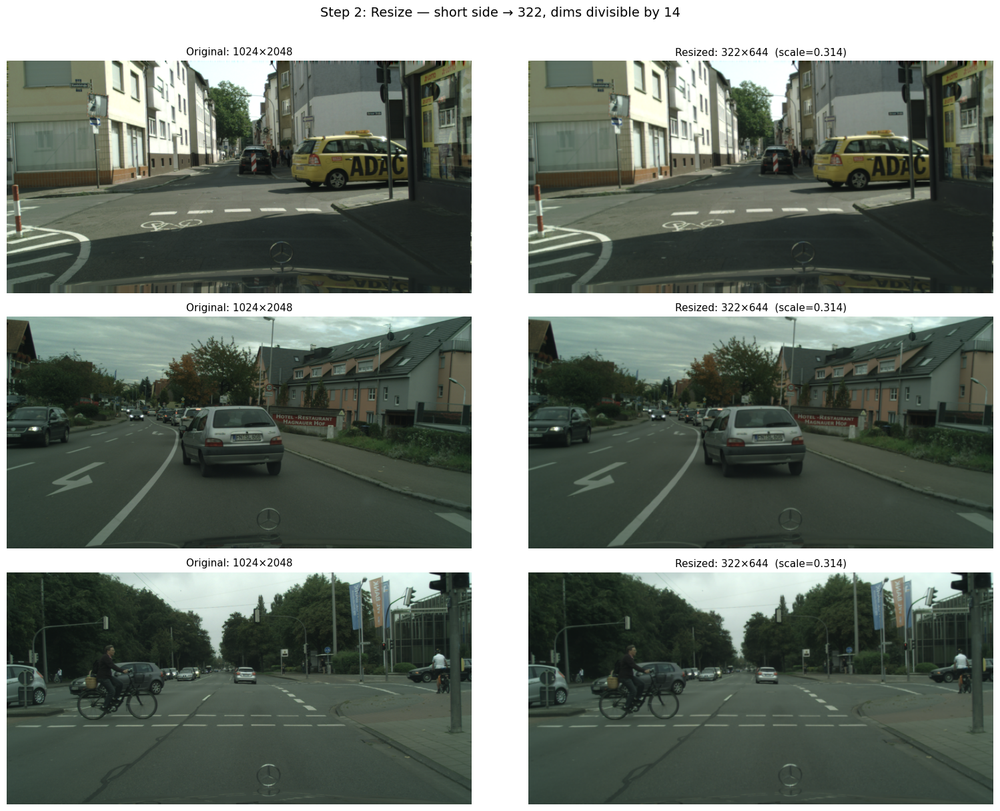

frankfurt_000000_000294: 1024×2048 → 322×644  (tokens: 23×46 = 1058)
lindau_000000_000019: 1024×2048 → 322×644  (tokens: 23×46 = 1058)
munster_000000_000019: 1024×2048 → 322×644  (tokens: 23×46 = 1058)


In [16]:
# Cell 3: Step 2 — Resize (short side → 322, both dims ÷ 14)
CROP_SIZE = 322
PATCH_SIZE = 14

def resize_for_cause(pil_img, crop_size=322, patch_size=14):
    """Resize so short side = crop_size, both dims divisible by patch_size."""
    orig_w, orig_h = pil_img.size
    scale = crop_size / min(orig_h, orig_w)
    new_h = int(round(orig_h * scale / patch_size)) * patch_size
    new_w = int(round(orig_w * scale / patch_size)) * patch_size
    return pil_img.resize((new_w, new_h), Image.BILINEAR), (orig_h, orig_w), (new_h, new_w)

fig, axes = plt.subplots(len(IMAGES), 2, figsize=(16, 4 * len(IMAGES)))
if len(IMAGES) == 1:
    axes = axes[np.newaxis, :]

resized_images = {}  # Store for later cells

for i, img_info in enumerate(IMAGES):
    pil_img = Image.open(img_info["img_path"]).convert("RGB")
    resized, (orig_h, orig_w), (new_h, new_w) = resize_for_cause(pil_img)
    resized_images[img_info["stem"]] = resized

    axes[i, 0].imshow(np.array(pil_img))
    axes[i, 0].set_title(f"Original: {orig_h}×{orig_w}", fontsize=11)
    axes[i, 0].axis("off")

    axes[i, 1].imshow(np.array(resized))
    axes[i, 1].set_title(f"Resized: {new_h}×{new_w}  (scale={CROP_SIZE/min(orig_h,orig_w):.3f})", fontsize=11)
    axes[i, 1].axis("off")

fig.suptitle("Step 2: Resize — short side → 322, dims divisible by 14", fontsize=14, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step02_resize.png", dpi=200, bbox_inches="tight")
plt.show()

# Print resize info
for img_info in IMAGES:
    pil_img = Image.open(img_info["img_path"]).convert("RGB")
    _, (oh, ow), (nh, nw) = resize_for_cause(pil_img)
    print(f"{img_info['stem']}: {oh}×{ow} → {nh}×{nw}  (tokens: {nh//14}×{nw//14} = {(nh//14)*(nw//14)})")

# Save individual resized images
for img_info in IMAGES:
    pil_img = Image.open(img_info["img_path"]).convert("RGB")
    resized_out, _, _ = resize_for_cause(pil_img)
    resized_out.save(SAVE_DIR / f"step02_{img_info['city']}_resized.png")


Resized image: 322×644
Crop size: 322×322, Stride: 161
X positions: [0, 161, 322]
Y positions: [0]
Total crops: 3


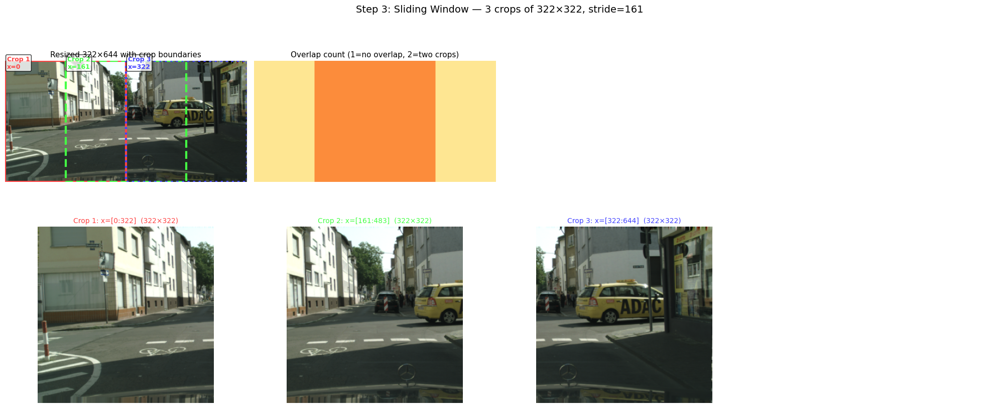

In [17]:
# Cell 4: Step 3 — Sliding Window Crops (stride=161, 3 overlapping crops)
# Visualize the 3 crop positions on one resized image

demo_stem = IMAGES[0]["stem"]
demo_resized = resized_images[demo_stem]
rh, rw = np.array(demo_resized).shape[:2]

stride = CROP_SIZE // 2  # 161
x_positions = sorted(set(list(range(0, rw - CROP_SIZE, stride)) + [rw - CROP_SIZE]))
y_positions = [0]  # H=322 = crop_size, so only 1 y position

print(f"Resized image: {rh}×{rw}")
print(f"Crop size: {CROP_SIZE}×{CROP_SIZE}, Stride: {stride}")
print(f"X positions: {x_positions}")
print(f"Y positions: {y_positions}")
print(f"Total crops: {len(x_positions) * len(y_positions)}")

# Top: show crop boundaries on resized image
fig, axes = plt.subplots(2, len(x_positions) + 1, figsize=(20, 8),
                          gridspec_kw={"height_ratios": [1, 1]})

# Full image with rectangles
colors = ["#FF4444", "#44FF44", "#4444FF"]
ax_full = axes[0, 0]
ax_full.imshow(np.array(demo_resized))
for j, x_pos in enumerate(x_positions):
    rect = plt.Rectangle((x_pos, 0), CROP_SIZE, CROP_SIZE,
                          linewidth=3, edgecolor=colors[j], facecolor="none",
                          linestyle=["solid", "dashed", "dotted"][j])
    ax_full.add_patch(rect)
    ax_full.text(x_pos + 5, 20, f"Crop {j+1}\nx={x_pos}", color=colors[j],
                 fontsize=9, fontweight="bold", bbox=dict(boxstyle="round,pad=0.2",
                 facecolor="white", alpha=0.8))
ax_full.set_title(f"Resized {rh}×{rw} with crop boundaries", fontsize=11)
ax_full.axis("off")

# Hide unused top-right cells
for j in range(1, len(x_positions) + 1):
    axes[0, j].axis("off")

# Overlap heatmap in axes[0, 1]
overlap_map = np.zeros((rh, rw), dtype=np.float32)
for x_pos in x_positions:
    overlap_map[:, x_pos:x_pos + CROP_SIZE] += 1.0
axes[0, 1].imshow(overlap_map, cmap="YlOrRd", vmin=0.5, vmax=3.5)
axes[0, 1].set_title("Overlap count (1=no overlap, 2=two crops)", fontsize=11)
axes[0, 1].axis("off")

# Individual crops
resized_np = np.array(demo_resized)
for j, x_pos in enumerate(x_positions):
    crop = resized_np[:CROP_SIZE, x_pos:x_pos + CROP_SIZE]
    axes[1, j].imshow(crop)
    axes[1, j].set_title(f"Crop {j+1}: x=[{x_pos}:{x_pos+CROP_SIZE}]  ({crop.shape[0]}×{crop.shape[1]})",
                          fontsize=10, color=colors[j])
    axes[1, j].axis("off")
axes[1, -1].axis("off")

fig.suptitle(f"Step 3: Sliding Window — 3 crops of {CROP_SIZE}×{CROP_SIZE}, stride={stride}", fontsize=14, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step03_sliding_window_crops.png", dpi=200, bbox_inches="tight")
plt.show()

# Save individual crops
resized_np_full = np.array(demo_resized)
for j, x_pos in enumerate(x_positions):
    crop_img = resized_np_full[:CROP_SIZE, x_pos:x_pos + CROP_SIZE]
    Image.fromarray(crop_img).save(SAVE_DIR / f"step03_crop{j+1}_x{x_pos}.png")


DINOv2 ViT-B/14 loaded on mps
Patch tokens shape: torch.Size([1, 529, 768])  (1, 529=23×23, 768-dim)
PCA explained variance: 24.9%


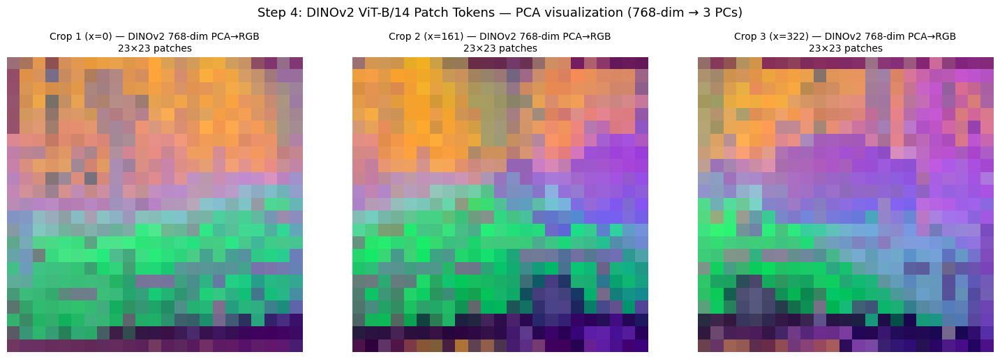

In [18]:
# Cell 5: Step 4 — DINOv2 ViT-B/14 Patch Tokens (768-dim, 23×23 per crop)
# Load CAUSE models (DINOv2 backbone + Segment_TR decoder)
from types import SimpleNamespace
from models.dinov2vit import dinov2_vit_base_14
from modules.segment import Segment_TR
from modules.segment_module import Cluster, transform, untransform

cause_args = SimpleNamespace(
    dim=768, reduced_dim=90, projection_dim=2048,
    num_codebook=2048, n_classes=27,
    num_queries=23 * 23, crop_size=322, patch_size=14,
)

# Load DINOv2 backbone
backbone_path = str(CAUSE_DIR / "checkpoint" / "dinov2_vit_base_14.pth")
net = dinov2_vit_base_14()
state = torch.load(backbone_path, map_location="cpu", weights_only=True)
net.load_state_dict(state, strict=False)
net = net.to(DEVICE).eval()
for p in net.parameters():
    p.requires_grad = False
print(f"DINOv2 ViT-B/14 loaded on {DEVICE}")

# Prepare one demo image — first crop of first image
demo_pil = resized_images[IMAGES[0]["stem"]]
demo_tensor = normalize(transforms.ToTensor()(demo_pil)).unsqueeze(0).to(DEVICE)  # (1, 3, 322, 644)

# Extract crop 1 (x=0)
crop1 = demo_tensor[:, :, :CROP_SIZE, :CROP_SIZE]  # (1, 3, 322, 322)
with torch.no_grad():
    tokens = net(crop1)  # (1, 530, 768) — [CLS] + 529 patch tokens
    patch_tokens = tokens[:, 1:, :]  # (1, 529, 768) — remove CLS
print(f"Patch tokens shape: {patch_tokens.shape}  (1, 529={23}×{23}, 768-dim)")

# PCA visualization: project 768-dim → 3 PCs for RGB
from sklearn.decomposition import PCA

# Extract all 3 crops' patch tokens for visualization
crop_tokens_list = []
for x_pos in [0, 161, 322]:
    crop = demo_tensor[:, :, :CROP_SIZE, x_pos:x_pos + CROP_SIZE]
    with torch.no_grad():
        toks = net(crop)[:, 1:, :].cpu().numpy().reshape(-1, 768)  # (529, 768)
    crop_tokens_list.append(toks)

all_tokens = np.concatenate(crop_tokens_list, axis=0)  # (1587, 768)
pca = PCA(n_components=3)
pca.fit(all_tokens)
print(f"PCA explained variance: {pca.explained_variance_ratio_[:3].sum():.1%}")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for j, (toks, x_pos) in enumerate(zip(crop_tokens_list, [0, 161, 322])):
    pca_rgb = pca.transform(toks).reshape(23, 23, 3)
    # Normalize to [0, 1] for display
    pca_rgb = (pca_rgb - pca_rgb.min()) / (pca_rgb.max() - pca_rgb.min() + 1e-8)
    axes[j].imshow(pca_rgb)
    axes[j].set_title(f"Crop {j+1} (x={x_pos}) — DINOv2 768-dim PCA→RGB\n23×23 patches", fontsize=10)
    axes[j].axis("off")

fig.suptitle("Step 4: DINOv2 ViT-B/14 Patch Tokens — PCA visualization (768-dim → 3 PCs)", fontsize=13, y=1.02)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step04_dinov2_patch_tokens.png", dpi=200, bbox_inches="tight")
plt.show()

# Save individual DINOv2 PCA crops
for j, (toks, x_pos) in enumerate(zip(crop_tokens_list, [0, 161, 322])):
    pca_img = pca.transform(toks).reshape(23, 23, 3)
    pca_img = (pca_img - pca_img.min()) / (pca_img.max() - pca_img.min() + 1e-8)
    pca_uint8 = (pca_img * 255).astype(np.uint8)
    Image.fromarray(pca_uint8).save(SAVE_DIR / f"step04_dinov2_pca_crop{j+1}_x{x_pos}.png")


CAUSE Segment_TR loaded (frozen EMA decoder)
  Crop x=0: CAUSE features shape = torch.Size([1, 90, 23, 23])
  Crop x=161: CAUSE features shape = torch.Size([1, 90, 23, 23])
  Crop x=322: CAUSE features shape = torch.Size([1, 90, 23, 23])
CAUSE PCA explained variance: 76.6%


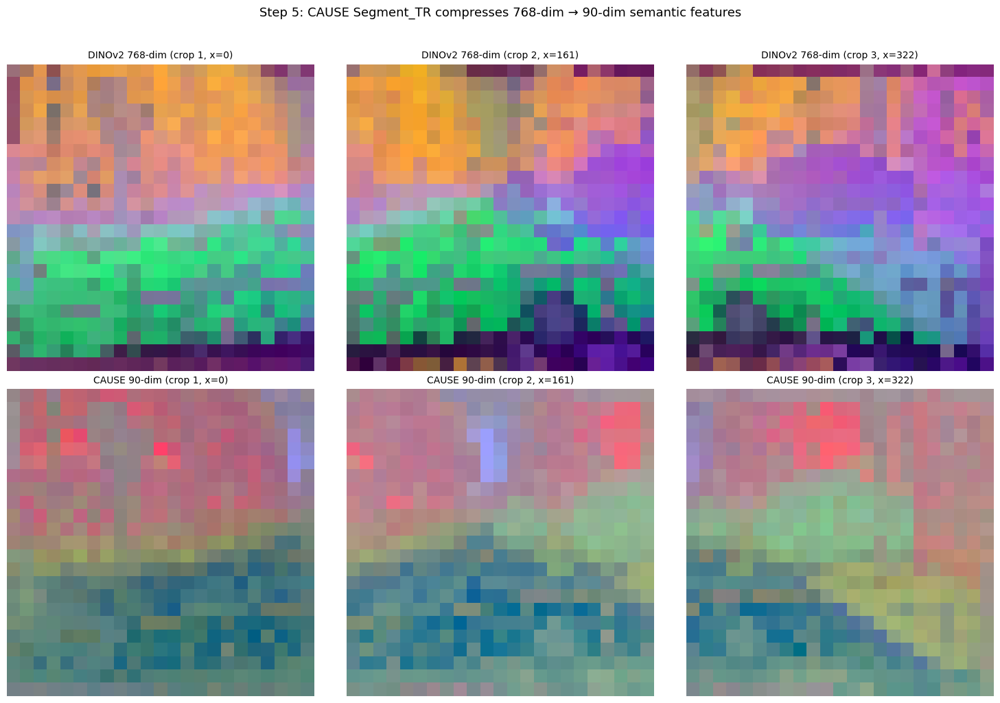

In [19]:
# Cell 6: Step 5 — CAUSE Segment_TR Features (90-dim, 23×23 per crop)
# Load Segment_TR decoder + modularity codebook
seg_path = str(CAUSE_DIR / "CAUSE" / "cityscapes" / "dinov2_vit_base_14" / "2048" / "segment_tr.pth")
segment = Segment_TR(cause_args).to(DEVICE)
seg_state = torch.load(seg_path, map_location="cpu", weights_only=True)
segment.load_state_dict(seg_state, strict=False)
segment.eval()

mod_path = str(CAUSE_DIR / "CAUSE" / "cityscapes" / "modularity" / "dinov2_vit_base_14" / "2048" / "modular.npy")
cb = torch.from_numpy(np.load(mod_path)).to(DEVICE)
segment.head.codebook = cb
segment.head_ema.codebook = cb
print("CAUSE Segment_TR loaded (frozen EMA decoder)")

def extract_cause_features_crop(net, segment, img_tensor):
    """Extract 90-dim CAUSE features for a single 322x322 crop.
    Returns: (1, 90, 23, 23) feature map."""
    with torch.no_grad():
        feat = net(img_tensor)[:, 1:, :]           # (1, 529, 768)
        feat_flip = net(img_tensor.flip(dims=[3]))[:, 1:, :]
        seg_feat = transform(segment.head_ema(feat))         # (1, 90, 23, 23)
        seg_feat_flip = transform(segment.head_ema(feat_flip))
        seg_feat = (seg_feat + seg_feat_flip.flip(dims=[3])) / 2
    return seg_feat

# Extract CAUSE features for all 3 crops
cause_feats_list = []
for x_pos in [0, 161, 322]:
    crop = demo_tensor[:, :, :CROP_SIZE, x_pos:x_pos + CROP_SIZE]
    cause_feat = extract_cause_features_crop(net, segment, crop)  # (1, 90, 23, 23)
    cause_feats_list.append(cause_feat.cpu().numpy().reshape(90, -1).T)  # (529, 90)
    print(f"  Crop x={x_pos}: CAUSE features shape = {cause_feat.shape}")

# PCA on CAUSE 90-dim features
all_cause = np.concatenate(cause_feats_list, axis=0)  # (1587, 90)
pca_cause = PCA(n_components=3)
pca_cause.fit(all_cause)
print(f"CAUSE PCA explained variance: {pca_cause.explained_variance_ratio_[:3].sum():.1%}")

# Compare DINOv2 raw vs CAUSE features side-by-side
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for j, (dino_toks, cause_toks, x_pos) in enumerate(zip(crop_tokens_list, cause_feats_list, [0, 161, 322])):
    # DINOv2 768-dim PCA
    dino_rgb = pca.transform(dino_toks).reshape(23, 23, 3)
    dino_rgb = (dino_rgb - dino_rgb.min()) / (dino_rgb.max() - dino_rgb.min() + 1e-8)
    axes[0, j].imshow(dino_rgb)
    axes[0, j].set_title(f"DINOv2 768-dim (crop {j+1}, x={x_pos})", fontsize=10)
    axes[0, j].axis("off")

    # CAUSE 90-dim PCA
    cause_rgb = pca_cause.transform(cause_toks).reshape(23, 23, 3)
    cause_rgb = (cause_rgb - cause_rgb.min()) / (cause_rgb.max() - cause_rgb.min() + 1e-8)
    axes[1, j].imshow(cause_rgb)
    axes[1, j].set_title(f"CAUSE 90-dim (crop {j+1}, x={x_pos})", fontsize=10)
    axes[1, j].axis("off")

axes[0, 0].set_ylabel("DINOv2\n768-dim", fontsize=12, rotation=0, labelpad=60)
axes[1, 0].set_ylabel("CAUSE\n90-dim", fontsize=12, rotation=0, labelpad=60)
fig.suptitle("Step 5: CAUSE Segment_TR compresses 768-dim → 90-dim semantic features", fontsize=13, y=1.02)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step05_cause_features.png", dpi=200, bbox_inches="tight")
plt.show()

# Save individual CAUSE PCA crops
for j, (cause_toks, x_pos) in enumerate(zip(cause_feats_list, [0, 161, 322])):
    cause_img = pca_cause.transform(cause_toks).reshape(23, 23, 3)
    cause_img = (cause_img - cause_img.min()) / (cause_img.max() - cause_img.min() + 1e-8)
    cause_uint8 = (cause_img * 255).astype(np.uint8)
    Image.fromarray(cause_uint8).save(SAVE_DIR / f"step05_cause_pca_crop{j+1}_x{x_pos}.png")


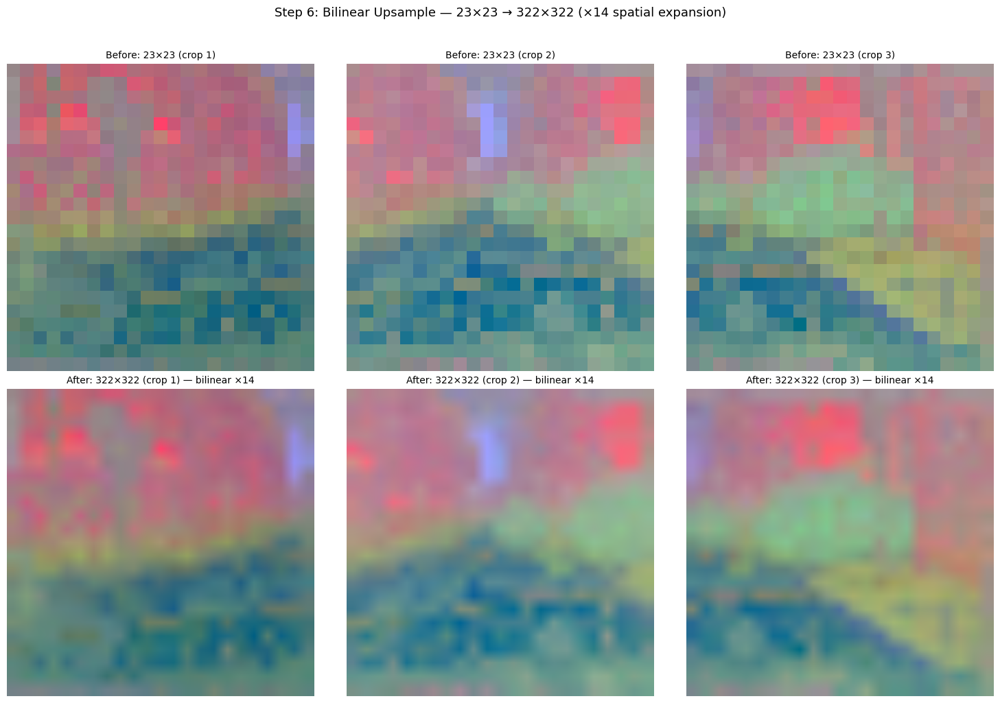

Note: Bilinear interpolation creates smooth transitions between patch boundaries.


In [20]:
# Cell 7: Step 6 — Bilinear Upsample (23×23 → 322×322 per crop)
# Show the upsampling effect on CAUSE features for each crop

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

cause_feats_upsampled = []  # Store for stitching in next cell
for j, x_pos in enumerate([0, 161, 322]):
    crop = demo_tensor[:, :, :CROP_SIZE, x_pos:x_pos + CROP_SIZE]
    cause_feat = extract_cause_features_crop(net, segment, crop)  # (1, 90, 23, 23)

    # Before upsample: 23×23
    feat_23 = cause_feat[0].cpu().numpy()  # (90, 23, 23)

    # Bilinear upsample: 23×23 → 322×322
    feat_up = F.interpolate(cause_feat, size=(CROP_SIZE, CROP_SIZE),
                            mode='bilinear', align_corners=False)  # (1, 90, 322, 322)
    feat_322 = feat_up[0].cpu().numpy()  # (90, 322, 322)
    cause_feats_upsampled.append((x_pos, feat_up[0].cpu()))  # Store tensor

    # PCA visualization
    pca_before = pca_cause.transform(feat_23.reshape(90, -1).T).reshape(23, 23, 3)
    pca_before = (pca_before - pca_before.min()) / (pca_before.max() - pca_before.min() + 1e-8)

    pca_after = pca_cause.transform(feat_322.reshape(90, -1).T).reshape(322, 322, 3)
    pca_after = (pca_after - pca_after.min()) / (pca_after.max() - pca_after.min() + 1e-8)

    axes[0, j].imshow(pca_before, interpolation='nearest')
    axes[0, j].set_title(f"Before: 23×23 (crop {j+1})", fontsize=10)
    axes[0, j].axis("off")

    axes[1, j].imshow(pca_after)
    axes[1, j].set_title(f"After: 322×322 (crop {j+1}) — bilinear ×14", fontsize=10)
    axes[1, j].axis("off")

axes[0, 0].set_ylabel("23×23\n(raw)", fontsize=12, rotation=0, labelpad=50)
axes[1, 0].set_ylabel("322×322\n(upsampled)", fontsize=12, rotation=0, labelpad=50)
fig.suptitle("Step 6: Bilinear Upsample — 23×23 → 322×322 (×14 spatial expansion)", fontsize=13, y=1.02)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step06_bilinear_upsample.png", dpi=200, bbox_inches="tight")
plt.show()
print("Note: Bilinear interpolation creates smooth transitions between patch boundaries.")

# Save individual upsampled PCA crops
for j, x_pos in enumerate([0, 161, 322]):
    crop_t = demo_tensor[:, :, :CROP_SIZE, x_pos:x_pos + CROP_SIZE]
    cf = extract_cause_features_crop(net, segment, crop_t)
    f23 = cf[0].cpu().numpy().reshape(90, -1).T
    pca_b = pca_cause.transform(f23).reshape(23, 23, 3)
    pca_b = (pca_b - pca_b.min()) / (pca_b.max() - pca_b.min() + 1e-8)
    Image.fromarray((pca_b * 255).astype(np.uint8)).save(
        SAVE_DIR / f"step06_before_upsample_crop{j+1}.png")
    fu = F.interpolate(cf, size=(CROP_SIZE, CROP_SIZE), mode='bilinear', align_corners=False)
    f322 = fu[0].cpu().numpy().reshape(90, -1).T
    pca_a = pca_cause.transform(f322).reshape(322, 322, 3)
    pca_a = (pca_a - pca_a.min()) / (pca_a.max() - pca_a.min() + 1e-8)
    Image.fromarray((pca_a * 255).astype(np.uint8)).save(
        SAVE_DIR / f"step06_after_upsample_crop{j+1}.png")


Stitched feature map: torch.Size([90, 322, 644])


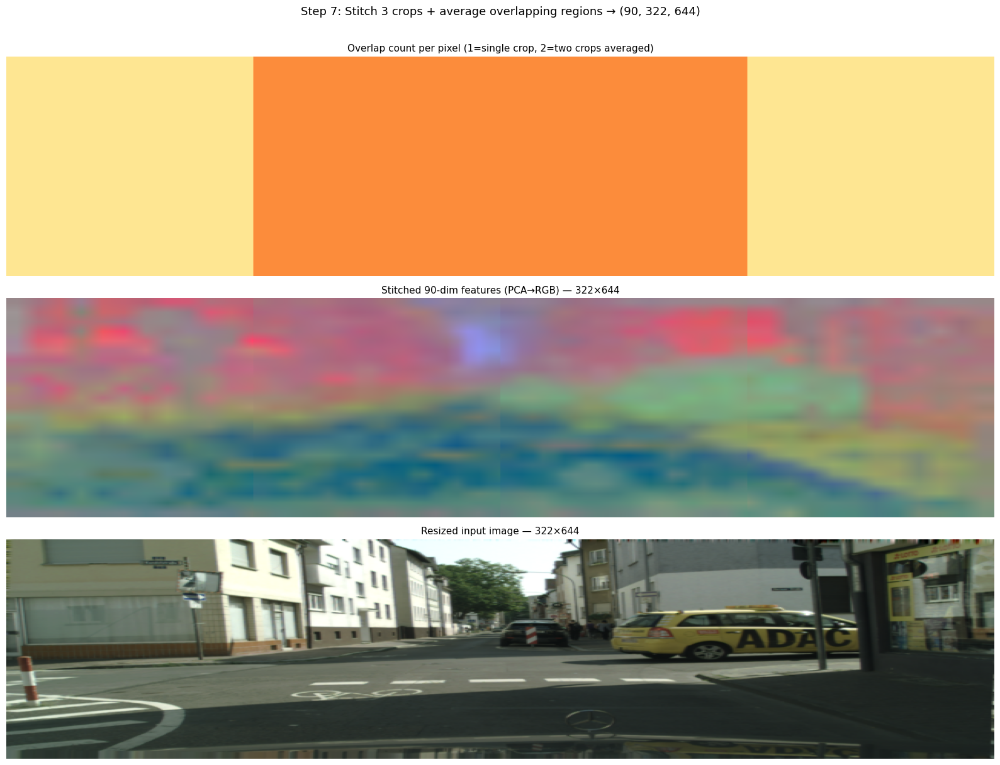

In [21]:
# Cell 8: Step 7 — Stitch Crops + Average Overlaps
# Combine the 3 upsampled crops into one (90, 322, 644) feature map

demo_pil = resized_images[IMAGES[0]["stem"]]
rh, rw = np.array(demo_pil).shape[:2]

feat_sum = torch.zeros(90, rh, rw)
count = torch.zeros(1, rh, rw)

for x_pos, feat_up in cause_feats_upsampled:
    ch = min(CROP_SIZE, rh)
    cw = min(CROP_SIZE, rw - x_pos)
    feat_sum[:, :ch, x_pos:x_pos + cw] += feat_up[:, :ch, :cw]
    count[:, :ch, x_pos:x_pos + cw] += 1

stitched_feat = feat_sum / count.clamp(min=1)  # (90, 322, 644)
print(f"Stitched feature map: {stitched_feat.shape}")

# Visualize: stitched PCA + overlap count
fig, axes = plt.subplots(3, 1, figsize=(16, 12))

# Overlap count
axes[0].imshow(count[0].numpy(), cmap="YlOrRd", vmin=0.5, vmax=3.5, aspect="auto")
axes[0].set_title("Overlap count per pixel (1=single crop, 2=two crops averaged)", fontsize=11)
axes[0].axis("off")

# Stitched features PCA
stitched_np = stitched_feat.numpy().reshape(90, -1).T  # (H*W, 90)
pca_stitched = pca_cause.transform(stitched_np).reshape(rh, rw, 3)
pca_stitched = (pca_stitched - pca_stitched.min()) / (pca_stitched.max() - pca_stitched.min() + 1e-8)
axes[1].imshow(pca_stitched, aspect="auto")
axes[1].set_title(f"Stitched 90-dim features (PCA→RGB) — {rh}×{rw}", fontsize=11)
axes[1].axis("off")

# Original resized for comparison
axes[2].imshow(np.array(demo_pil), aspect="auto")
axes[2].set_title(f"Resized input image — {rh}×{rw}", fontsize=11)
axes[2].axis("off")

fig.suptitle("Step 7: Stitch 3 crops + average overlapping regions → (90, 322, 644)", fontsize=13, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step07_stitch_average.png", dpi=200, bbox_inches="tight")
plt.show()

# Save individual sub-images
plt.imsave(SAVE_DIR / "step07_overlap_count.png", count[0].numpy(), cmap="YlOrRd", vmin=0.5, vmax=3.5)
Image.fromarray((pca_stitched * 255).astype(np.uint8)).save(SAVE_DIR / "step07_stitched_pca.png")
np.array(demo_pil).astype(np.uint8)
Image.fromarray(np.array(demo_pil)).save(SAVE_DIR / "step07_resized_reference.png")


Before L2 norm — min: 19.909, max: 110.467, mean: 45.898, std: 13.076
After L2 norm  — min: 1.000000, max: 1.000000 (should be ~1.0)
Normalized PCA explained variance: 75.0%


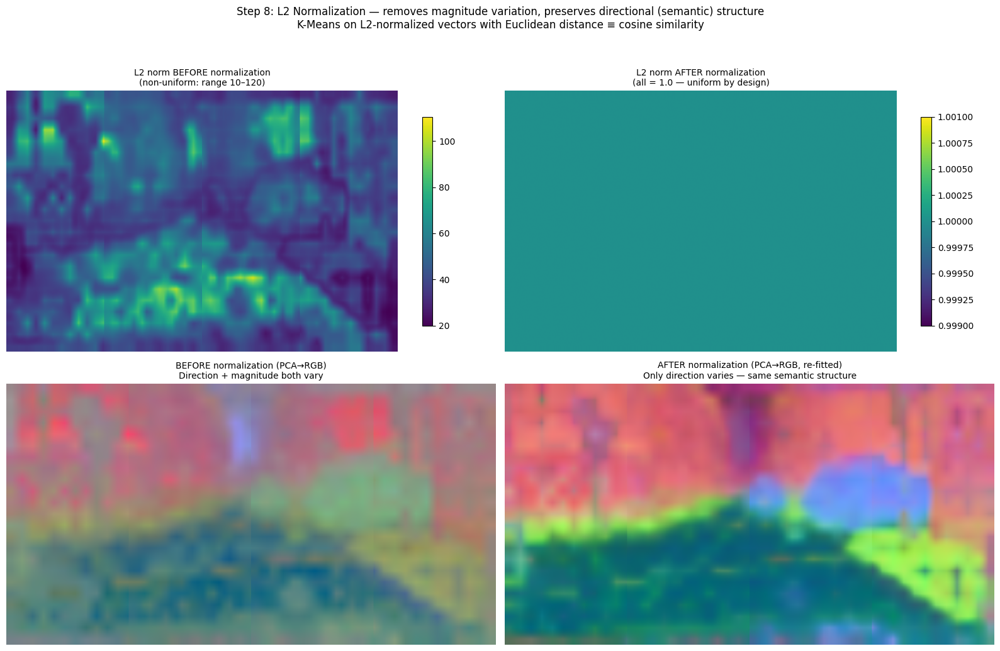


Why normalize? Without L2 norm, K-Means would be biased by vector magnitude.
After normalization, only the DIRECTION matters — which encodes semantic class.


In [22]:
# Cell 9: Step 8 — L2 Normalization
# L2-normalize each pixel's 90-dim vector so K-Means with Euclidean ≡ cosine similarity

# Compute norms before normalization
norms_before = torch.norm(stitched_feat, dim=0)  # (322, 644)
print(f"Before L2 norm — min: {norms_before.min():.3f}, max: {norms_before.max():.3f}, "
      f"mean: {norms_before.mean():.3f}, std: {norms_before.std():.3f}")

# L2 normalize
normalized_feat = F.normalize(stitched_feat, dim=0, p=2)  # (90, 322, 644)
norms_after = torch.norm(normalized_feat, dim=0)
print(f"After L2 norm  — min: {norms_after.min():.6f}, max: {norms_after.max():.6f} (should be ~1.0)")

# Fit a NEW PCA on normalized features (old PCA was on un-normalized — different scale)
norm_np = normalized_feat.numpy().reshape(90, -1).T  # (H*W, 90)
pca_norm = PCA(n_components=3)
pca_norm.fit(norm_np)
print(f"Normalized PCA explained variance: {pca_norm.explained_variance_ratio_[:3].sum():.1%}")

# Visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Top-left: norm heatmap BEFORE
im0 = axes[0, 0].imshow(norms_before.numpy(), cmap="viridis", aspect="auto")
axes[0, 0].set_title("L2 norm BEFORE normalization\n(non-uniform: range 10–120)", fontsize=10)
axes[0, 0].axis("off")
plt.colorbar(im0, ax=axes[0, 0], shrink=0.8)

# Top-right: norm heatmap AFTER (uniform — this SHOULD look plain!)
im1 = axes[0, 1].imshow(norms_after.numpy(), cmap="viridis", aspect="auto",
                          vmin=0.999, vmax=1.001)
axes[0, 1].set_title("L2 norm AFTER normalization\n(all = 1.0 — uniform by design)", fontsize=10)
axes[0, 1].axis("off")
plt.colorbar(im1, ax=axes[0, 1], shrink=0.8)

# Bottom-left: PCA of UN-normalized features (re-using pca_cause from Cell 6)
stitched_pca = pca_cause.transform(stitched_feat.numpy().reshape(90, -1).T).reshape(rh, rw, 3)
stitched_pca = (stitched_pca - stitched_pca.min()) / (stitched_pca.max() - stitched_pca.min() + 1e-8)
axes[1, 0].imshow(stitched_pca, aspect="auto")
axes[1, 0].set_title("BEFORE normalization (PCA→RGB)\nDirection + magnitude both vary", fontsize=10)
axes[1, 0].axis("off")

# Bottom-right: PCA of NORMALIZED features (re-fitted PCA on normalized data)
norm_pca_rgb = pca_norm.transform(norm_np).reshape(rh, rw, 3)
norm_pca_rgb = (norm_pca_rgb - norm_pca_rgb.min()) / (norm_pca_rgb.max() - norm_pca_rgb.min() + 1e-8)
axes[1, 1].imshow(norm_pca_rgb, aspect="auto")
axes[1, 1].set_title("AFTER normalization (PCA→RGB, re-fitted)\nOnly direction varies — same semantic structure", fontsize=10)
axes[1, 1].axis("off")

fig.suptitle("Step 8: L2 Normalization — removes magnitude variation, preserves directional (semantic) structure\n"
             "K-Means on L2-normalized vectors with Euclidean distance ≡ cosine similarity",
             fontsize=12, y=1.03)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step08_l2_normalization.png", dpi=200, bbox_inches="tight")
plt.show()

print("\nWhy normalize? Without L2 norm, K-Means would be biased by vector magnitude.")
print("After normalization, only the DIRECTION matters — which encodes semantic class.")

# Save individual sub-images
plt.imsave(SAVE_DIR / "step08_norm_before.png", norms_before.numpy(), cmap="viridis")
plt.imsave(SAVE_DIR / "step08_norm_after.png", norms_after.numpy(), cmap="viridis", vmin=0.999, vmax=1.001)
Image.fromarray((norm_pca_rgb * 255).astype(np.uint8)).save(SAVE_DIR / "step08_normalized_pca.png")
# Also save the before-normalization PCA
Image.fromarray((stitched_pca * 255).astype(np.uint8)).save(SAVE_DIR / "step08_before_norm_pca.png")


Loaded centroids: (80, 90)  (k=80, 90-dim)
Cluster map: (322, 644), unique clusters: 62/80


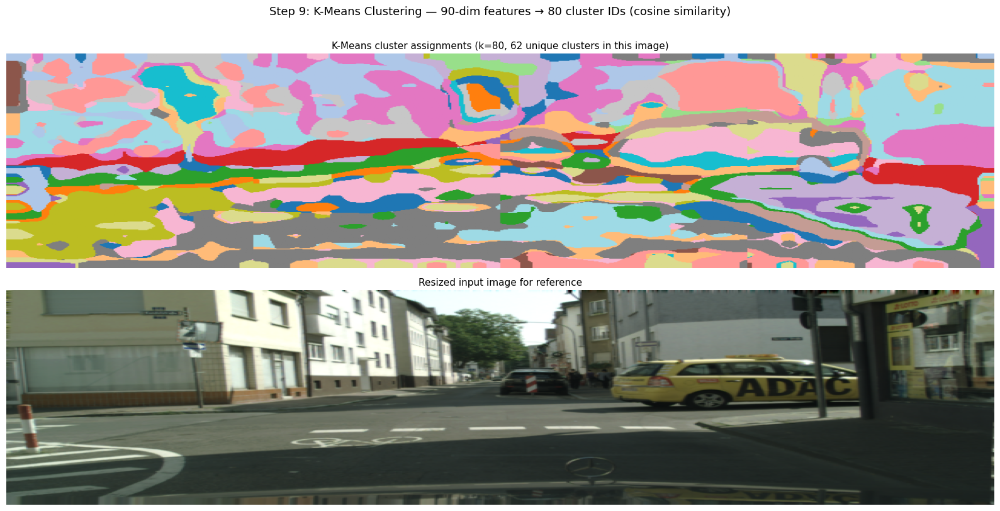

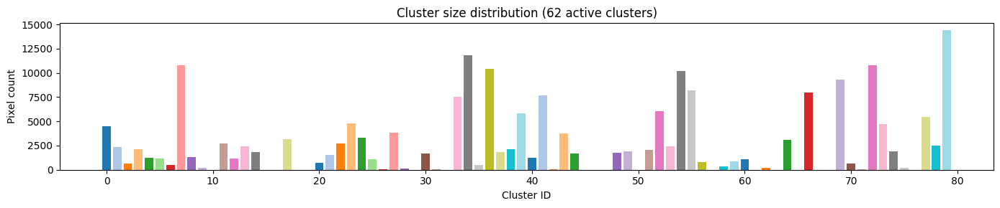

In [23]:
# Cell 10: Step 9 — K-Means Clustering (k=80)
# Load pre-fitted centroids and assign each pixel to nearest cluster

centroids_path = str(CS_ROOT / "pseudo_semantic_raw_k80" / "kmeans_centroids.npz")
centroids_data = np.load(centroids_path)
centroids = centroids_data["centroids"]  # (80, 90)
print(f"Loaded centroids: {centroids.shape}  (k=80, 90-dim)")

# L2-normalize centroids (they should already be, but ensure consistency)
centroids_norm = centroids / (np.linalg.norm(centroids, axis=1, keepdims=True) + 1e-8)

# Assign each pixel: argmin Euclidean distance on L2-normalized vectors ≡ argmax cosine similarity
pixels = normalized_feat.numpy().reshape(90, -1).T  # (H*W, 90)
distances = np.linalg.norm(pixels[:, None, :] - centroids_norm[None, :, :], axis=2)  # (H*W, 80)
cluster_ids = distances.argmin(axis=1).reshape(rh, rw)  # (322, 644)

n_unique = len(np.unique(cluster_ids))
print(f"Cluster map: {cluster_ids.shape}, unique clusters: {n_unique}/80")

# Visualize with tab20 colormap
TAB20 = plt.get_cmap("tab20")
cluster_rgb = np.zeros((rh, rw, 3), dtype=np.float32)
for cid in np.unique(cluster_ids):
    mask = cluster_ids == cid
    cluster_rgb[mask] = np.array(TAB20((cid % 20) / 20.0)[:3])

fig, axes = plt.subplots(2, 1, figsize=(16, 8))
axes[0].imshow(cluster_rgb, aspect="auto")
axes[0].set_title(f"K-Means cluster assignments (k=80, {n_unique} unique clusters in this image)", fontsize=11)
axes[0].axis("off")

axes[1].imshow(np.array(demo_pil), aspect="auto")
axes[1].set_title("Resized input image for reference", fontsize=11)
axes[1].axis("off")

fig.suptitle("Step 9: K-Means Clustering — 90-dim features → 80 cluster IDs (cosine similarity)", fontsize=13, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step09_kmeans_clusters.png", dpi=200, bbox_inches="tight")
plt.show()

# Show cluster size distribution
unique, counts = np.unique(cluster_ids, return_counts=True)
fig, ax = plt.subplots(1, 1, figsize=(14, 3))
ax.bar(unique, counts, color=[TAB20((c % 20) / 20.0) for c in unique])
ax.set_xlabel("Cluster ID")
ax.set_ylabel("Pixel count")
ax.set_title(f"Cluster size distribution ({n_unique} active clusters)")
plt.tight_layout()
fig.savefig(SAVE_DIR / "step09_kmeans_distribution.png", dpi=200, bbox_inches="tight")
plt.show()

# Save individual sub-images
Image.fromarray((cluster_rgb * 255).astype(np.uint8)).save(SAVE_DIR / "step09_cluster_map_322x644.png")


Upsampled cluster map: (1024, 2048)  (from (322, 644))
Unique clusters preserved: 62


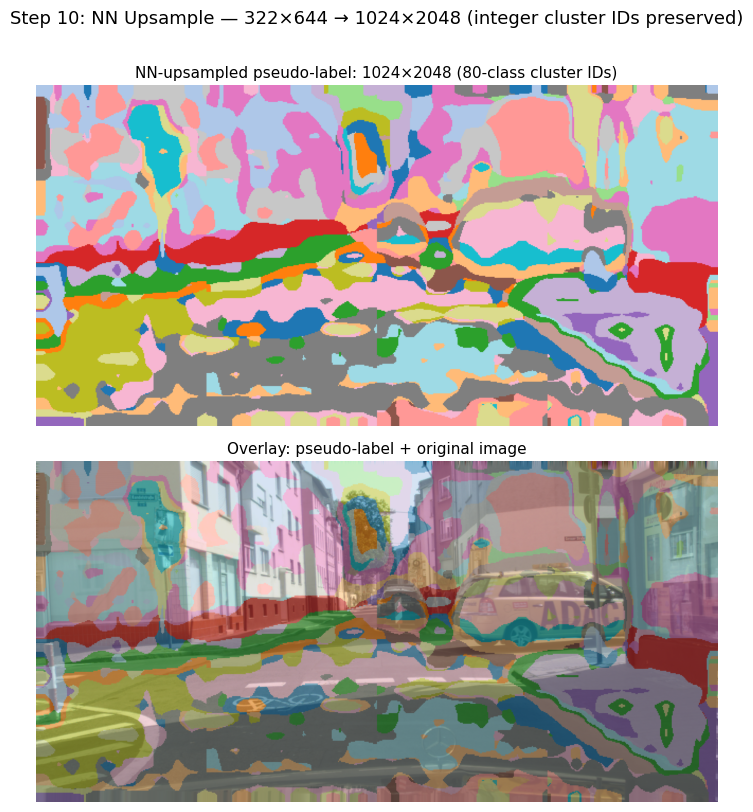

In [24]:
# Cell 11: Step 10 — Nearest-Neighbor Upsample to Original Resolution (322×644 → 1024×2048)
# Integer cluster IDs must use NN interpolation (no blending between classes)

orig_img = np.array(Image.open(IMAGES[0]["img_path"]).convert("RGB"))
orig_h, orig_w = orig_img.shape[:2]

# NN upsample cluster map
cluster_tensor = torch.from_numpy(cluster_ids).unsqueeze(0).unsqueeze(0).float()  # (1, 1, 322, 644)
cluster_fullres = F.interpolate(cluster_tensor, size=(orig_h, orig_w),
                                 mode='nearest')[0, 0].numpy().astype(np.uint8)  # (1024, 2048)

print(f"Upsampled cluster map: {cluster_fullres.shape}  (from {cluster_ids.shape})")
print(f"Unique clusters preserved: {len(np.unique(cluster_fullres))}")

# Colorize
cluster_fullres_rgb = np.zeros((orig_h, orig_w, 3), dtype=np.float32)
for cid in np.unique(cluster_fullres):
    mask = cluster_fullres == cid
    cluster_fullres_rgb[mask] = np.array(TAB20((cid % 20) / 20.0)[:3])

fig, axes = plt.subplots(2, 1, figsize=(16, 8))
axes[0].imshow(cluster_fullres_rgb)
axes[0].set_title(f"NN-upsampled pseudo-label: {orig_h}×{orig_w} (80-class cluster IDs)", fontsize=11)
axes[0].axis("off")

# Overlay on original
overlay = 0.5 * orig_img.astype(np.float32) / 255.0 + 0.5 * cluster_fullres_rgb
axes[1].imshow(overlay)
axes[1].set_title("Overlay: pseudo-label + original image", fontsize=11)
axes[1].axis("off")

fig.suptitle("Step 10: NN Upsample — 322×644 → 1024×2048 (integer cluster IDs preserved)", fontsize=13, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step10_nn_upsample.png", dpi=200, bbox_inches="tight")
plt.show()

# Save individual sub-images
Image.fromarray((cluster_fullres_rgb * 255).astype(np.uint8)).save(
    SAVE_DIR / "step10_cluster_map_fullres.png")
overlay_uint8 = (overlay * 255).clip(0, 255).astype(np.uint8)
Image.fromarray(overlay_uint8).save(SAVE_DIR / "step10_overlay_fullres.png")


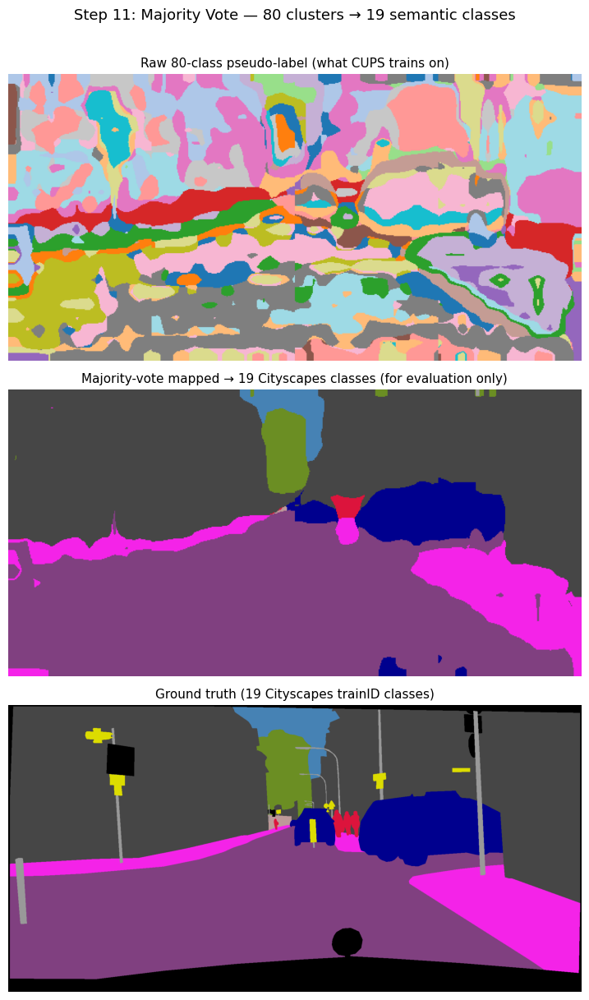


Cluster → Class mapping (for clusters in this image):
  Cluster  0 → road            (class  0,  45890 pixels)
  Cluster  1 → building        (class  2,  23920 pixels)
  Cluster  2 → vegetation      (class  8,   6206 pixels)
  Cluster  3 → road            (class  0,  21749 pixels)
  Cluster  4 → sidewalk        (class  1,  12110 pixels)
  Cluster  5 → sky             (class 10,  11865 pixels)
  Cluster  6 → person          (class 11,   4973 pixels)
  Cluster  7 → building        (class  2, 109562 pixels)
  Cluster  8 → sidewalk        (class  1,  13103 pixels)
  Cluster  9 → vegetation      (class  8,   2159 pixels)
  Cluster 11 → building        (class  2,  27806 pixels)
  Cluster 12 → vegetation      (class  8,  12114 pixels)
  Cluster 13 → road            (class  0,  24195 pixels)
  Cluster 14 → car             (class 13,  18785 pixels)
  Cluster 17 → building        (class  2,  32113 pixels)
  Cluster 20 → vegetation      (class  8,   6937 pixels)
  Cluster 21 → road            (c

In [25]:
# Cell 12: Step 11 — Majority Vote Mapping (80 clusters → 19 Cityscapes classes)
# This mapping is built from train set: for each cluster, count GT class pixels, assign majority class
# NOTE: CUPS trains on raw 80-class IDs. Majority vote is only for evaluation.

# Load GT for this image
gt_path = IMAGES[0]["gt_path"]
gt_raw = np.array(Image.open(gt_path))

# Remap GT to trainIDs
def remap_to_trainids(gt):
    remapped = np.full_like(gt, 255, dtype=np.uint8)
    for raw_id, train_id in CS_ID_TO_TRAIN.items():
        remapped[gt == raw_id] = train_id
    return remapped

gt_train = remap_to_trainids(gt_raw)

# Build majority vote mapping from this single image (in practice, done over full train set)
# For visualization, we'll use a simple per-image mapping
mapping = {}
for cid in np.unique(cluster_fullres):
    mask = cluster_fullres == cid
    gt_in_cluster = gt_train[mask]
    valid = gt_in_cluster[gt_in_cluster != 255]
    if len(valid) > 0:
        mapping[cid] = np.bincount(valid, minlength=19).argmax()
    else:
        mapping[cid] = 255  # No valid GT — ignore

# Apply mapping
mapped_19cls = np.full_like(cluster_fullres, 255, dtype=np.uint8)
for cid, cls_id in mapping.items():
    mapped_19cls[cluster_fullres == cid] = cls_id

# Colorize with Cityscapes palette
mapped_rgb = np.zeros((orig_h, orig_w, 3), dtype=np.uint8)
for cls_id in range(19):
    mapped_rgb[mapped_19cls == cls_id] = CS_COLORS[cls_id]

gt_rgb = np.zeros((orig_h, orig_w, 3), dtype=np.uint8)
for cls_id in range(19):
    gt_rgb[gt_train == cls_id] = CS_COLORS[cls_id]

# Display
fig, axes = plt.subplots(3, 1, figsize=(16, 12))
axes[0].imshow(cluster_fullres_rgb)
axes[0].set_title("Raw 80-class pseudo-label (what CUPS trains on)", fontsize=11)
axes[0].axis("off")

axes[1].imshow(mapped_rgb)
axes[1].set_title("Majority-vote mapped → 19 Cityscapes classes (for evaluation only)", fontsize=11)
axes[1].axis("off")

axes[2].imshow(gt_rgb)
axes[2].set_title("Ground truth (19 Cityscapes trainID classes)", fontsize=11)
axes[2].axis("off")

fig.suptitle("Step 11: Majority Vote — 80 clusters → 19 semantic classes", fontsize=13, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step11_majority_vote.png", dpi=200, bbox_inches="tight")
plt.show()

# Print mapping summary
print("\nCluster → Class mapping (for clusters in this image):")
for cid in sorted(mapping.keys()):
    cls_id = mapping[cid]
    cls_name = CS_CLASS_NAMES[cls_id] if cls_id < 19 else "ignore"
    n_pixels = (cluster_fullres == cid).sum()
    print(f"  Cluster {cid:2d} → {cls_name:15s} (class {cls_id:2d}, {n_pixels:6d} pixels)")

# Save individual sub-images
Image.fromarray((cluster_fullres_rgb * 255).astype(np.uint8)).save(
    SAVE_DIR / "step11_raw_80class.png")
Image.fromarray(mapped_rgb).save(SAVE_DIR / "step11_mapped_19class.png")
Image.fromarray(gt_rgb).save(SAVE_DIR / "step11_ground_truth.png")


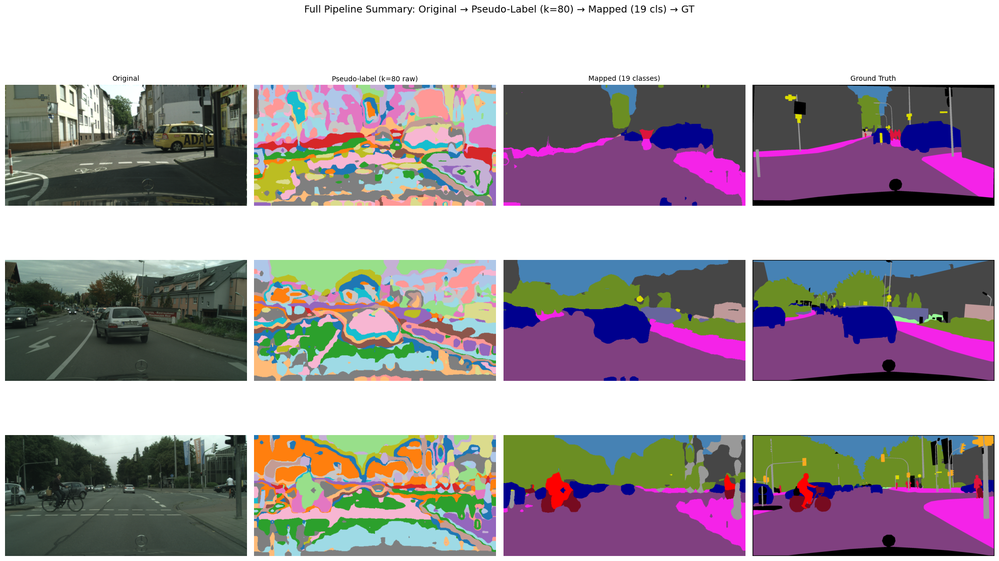

Pipeline complete.
Key insight: CUPS trains on the raw 80-class pseudo-labels (column 2),
NOT the 19-class mapped version. Majority vote is evaluation-only.


In [26]:
# Cell 13: Summary — Full Pipeline for All 3 Images
# For each image: Original → Pre-computed pseudo-label (80-class) → GT

fig, axes = plt.subplots(len(IMAGES), 4, figsize=(20, 4 * len(IMAGES)))
if len(IMAGES) == 1:
    axes = axes[np.newaxis, :]

for i, img_info in enumerate(IMAGES):
    # Original
    orig = np.array(Image.open(img_info["img_path"]).convert("RGB"))
    axes[i, 0].imshow(orig)
    axes[i, 0].set_title("Original" if i == 0 else "", fontsize=10)
    axes[i, 0].set_ylabel(img_info["city"], fontsize=11, rotation=0, labelpad=50)
    axes[i, 0].axis("off")

    # Pre-computed pseudo-label (raw k=80)
    pl_raw = np.array(Image.open(img_info["pl_path"]))
    pl_rgb = np.zeros((*pl_raw.shape, 3), dtype=np.float32)
    for cid in np.unique(pl_raw):
        pl_rgb[pl_raw == cid] = np.array(TAB20((cid % 20) / 20.0)[:3])
    axes[i, 1].imshow(pl_rgb)
    axes[i, 1].set_title("Pseudo-label (k=80 raw)" if i == 0 else "", fontsize=10)
    axes[i, 1].axis("off")

    # Majority vote mapped (using per-image GT mapping for viz)
    gt_raw = np.array(Image.open(img_info["gt_path"]))
    gt_t = remap_to_trainids(gt_raw)
    img_mapping = {}
    for cid in np.unique(pl_raw):
        valid = gt_t[pl_raw == cid]
        valid = valid[valid != 255]
        img_mapping[cid] = np.bincount(valid, minlength=19).argmax() if len(valid) > 0 else 255
    mapped = np.full_like(pl_raw, 255, dtype=np.uint8)
    for cid, cls in img_mapping.items():
        mapped[pl_raw == cid] = cls
    m_rgb = np.zeros((*mapped.shape, 3), dtype=np.uint8)
    for c in range(19):
        m_rgb[mapped == c] = CS_COLORS[c]
    axes[i, 2].imshow(m_rgb)
    axes[i, 2].set_title("Mapped (19 classes)" if i == 0 else "", fontsize=10)
    axes[i, 2].axis("off")

    # GT
    gt_rgb = np.zeros((*gt_t.shape, 3), dtype=np.uint8)
    for c in range(19):
        gt_rgb[gt_t == c] = CS_COLORS[c]
    axes[i, 3].imshow(gt_rgb)
    axes[i, 3].set_title("Ground Truth" if i == 0 else "", fontsize=10)
    axes[i, 3].axis("off")

fig.suptitle("Full Pipeline Summary: Original → Pseudo-Label (k=80) → Mapped (19 cls) → GT",
             fontsize=14, y=1.01)
plt.tight_layout()
fig.savefig(SAVE_DIR / "step12_summary_all_images.png", dpi=200, bbox_inches="tight")
plt.show()

print("Pipeline complete.")
print("Key insight: CUPS trains on the raw 80-class pseudo-labels (column 2),")
print("NOT the 19-class mapped version. Majority vote is evaluation-only.")

# Save individual per-city sub-images
for i, img_info in enumerate(IMAGES):
    orig = np.array(Image.open(img_info["img_path"]).convert("RGB"))
    Image.fromarray(orig).save(SAVE_DIR / f"step12_{img_info['city']}_original.png")
    pl_raw = np.array(Image.open(img_info["pl_path"]))
    pl_rgb_save = np.zeros((*pl_raw.shape, 3), dtype=np.float32)
    for cid in np.unique(pl_raw):
        pl_rgb_save[pl_raw == cid] = np.array(TAB20((cid % 20) / 20.0)[:3])
    Image.fromarray((pl_rgb_save * 255).astype(np.uint8)).save(
        SAVE_DIR / f"step12_{img_info['city']}_pseudolabel_k80.png")
    gt_raw_s = np.array(Image.open(img_info["gt_path"]))
    gt_t_s = remap_to_trainids(gt_raw_s)
    gt_rgb_s = np.zeros((*gt_t_s.shape, 3), dtype=np.uint8)
    for c in range(19):
        gt_rgb_s[gt_t_s == c] = CS_COLORS[c]
    Image.fromarray(gt_rgb_s).save(SAVE_DIR / f"step12_{img_info['city']}_ground_truth.png")
